# Проверка на выбросы

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import dates
import seaborn as sns
import numpy as np
import pickle

In [5]:
df = pd.read_csv("DataSet(20170101-20191231)-Korea-AirPollutionSeoul.csv")

## Присутствуют ли так называемые спайки

Рассмотрим для одной станции

In [3]:
features = df.columns.values[5:]
features

array(['SO2', 'NO2', 'O3', 'CO', 'PM10', 'PM2.5'], dtype=object)

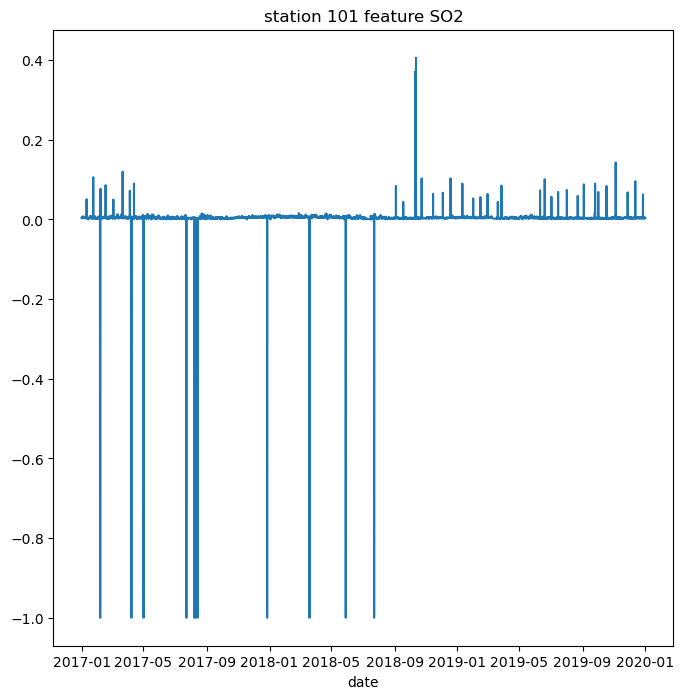

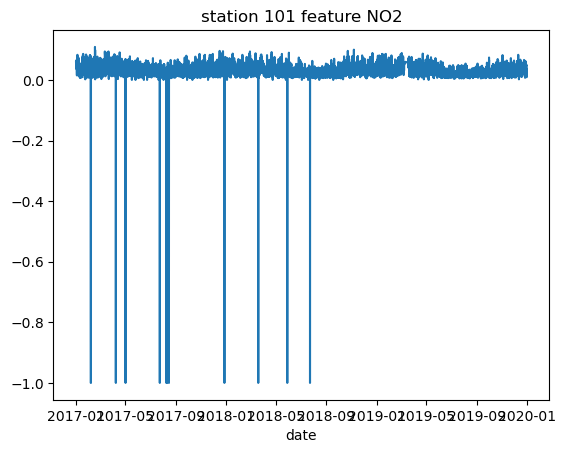

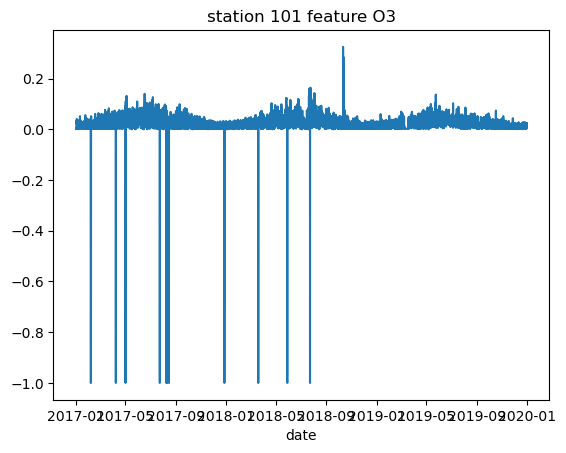

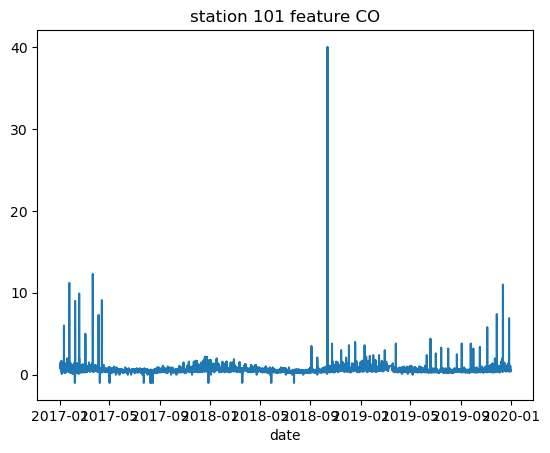

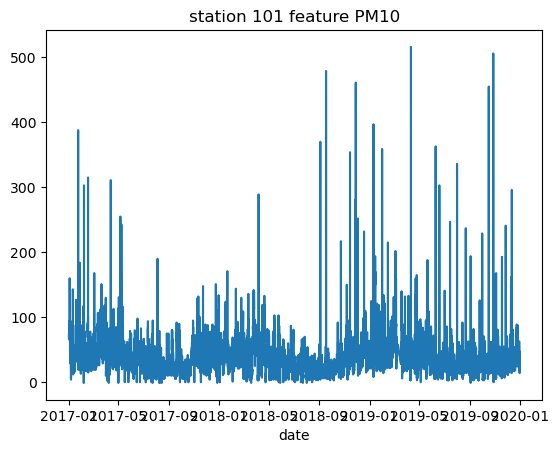

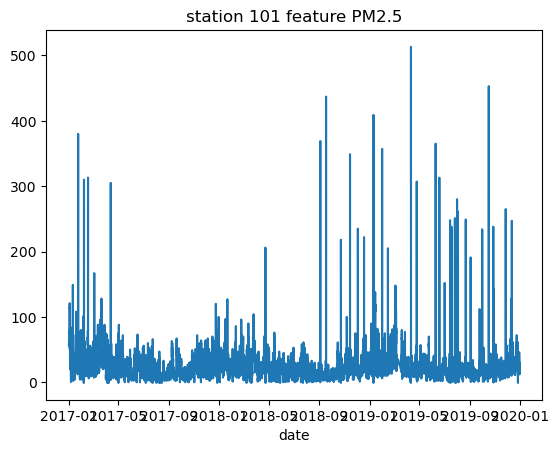

In [4]:
plt.figure(figsize=(8,8))

for i in range(101, 102):
    new_data = df[df['Station code'] == i]
    #new_date_time = pd.to_datetime(new_data['Measurement date'], format= '%Y/%m/%d') #по дням 
    new_date_time = pd.to_datetime(new_data['Measurement date'], format= '%Y/%m/%d %H:%M') # по часам
    
    for j in features:
        plt.plot(new_date_time, new_data[j])
        plt.title(f'station {i} feature {j}')
        plt.xlabel('date')
        plt.show()

<b>Действительно что-то есть</b>

![vnt](https://i01.fotocdn.net/s130/6ed68f5bb0ab65cf/public_pin_l/2933539745.jpg)

Также присутствуют отсутствующие величины (-1). Заменим их на наиболее частое значение

In [10]:
new_df = df.iloc[:, [0,1,5,6,7,8,9,10]]

In [11]:
mf_so2 = float(df['SO2'].mode())
mf_no2 = float(df['NO2'].mode())
mf_o3 = float(df['O3'].mode())
mf_co = float(df['CO'].mode())
mf_pm10 = float(df['PM10'].mode())
mf_pm25 = float(df['PM2.5'].mode())

mf_values = [mf_so2, mf_no2, mf_o3, mf_co, mf_pm10, mf_pm25]
#print(mf_values)

print(float(mf_co))

0.4


In [12]:
new_df.loc[new_df['SO2'] < 0, 'SO2'] = mf_so2
new_df.loc[new_df['NO2'] < 0, 'NO2'] = mf_no2
new_df.loc[new_df['O3'] < 0, 'O3'] = mf_o3
new_df.loc[new_df['CO'] < 0, 'CO'] = mf_co
new_df.loc[new_df['PM10'] < 0, 'PM10'] = mf_pm10
new_df.loc[new_df['PM2.5'] < 0, 'PM2.5'] = mf_pm25

Проверим заново

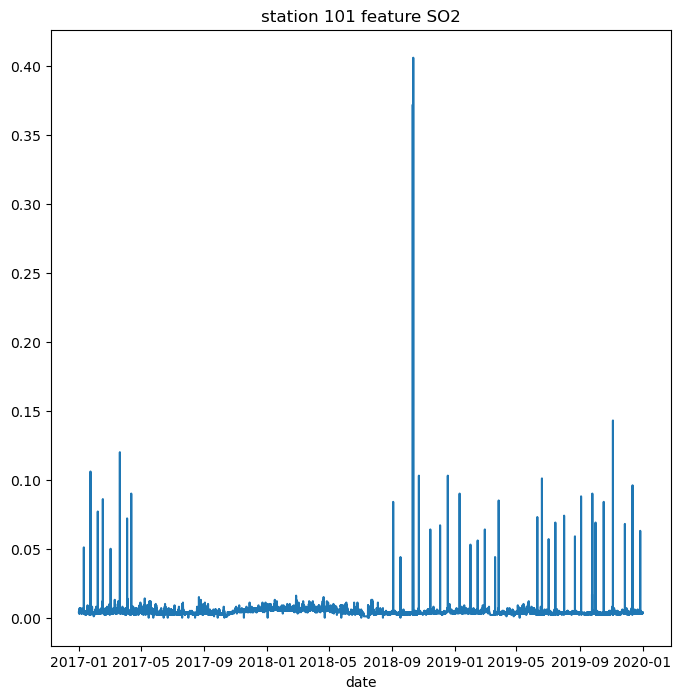

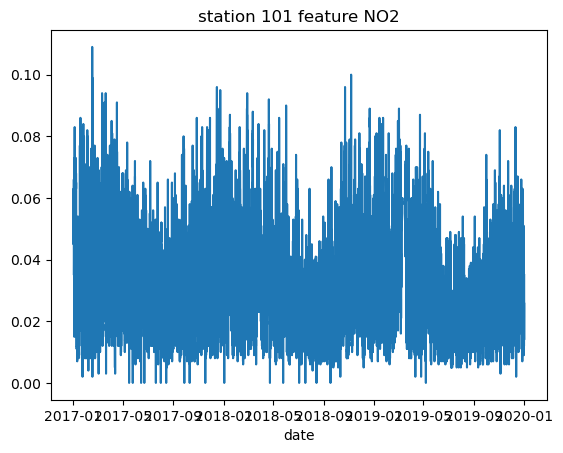

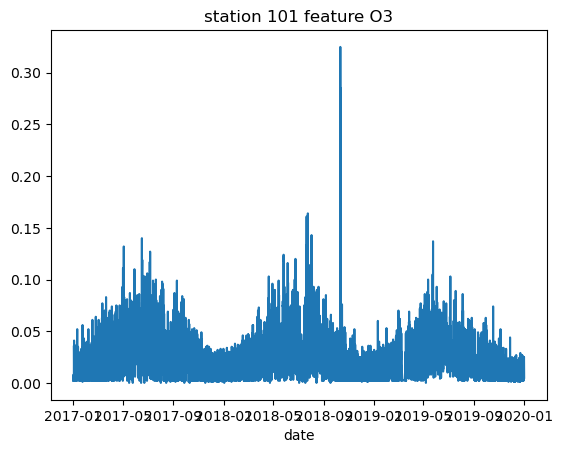

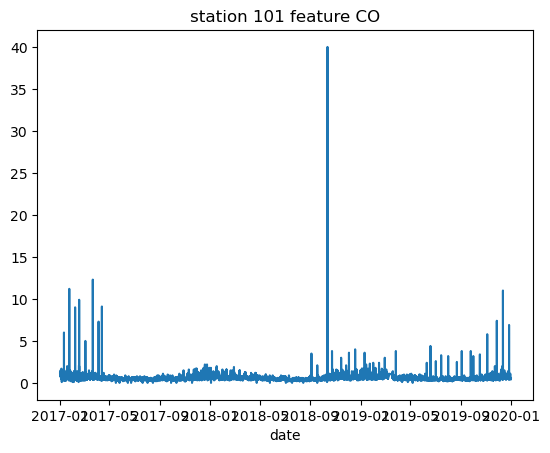

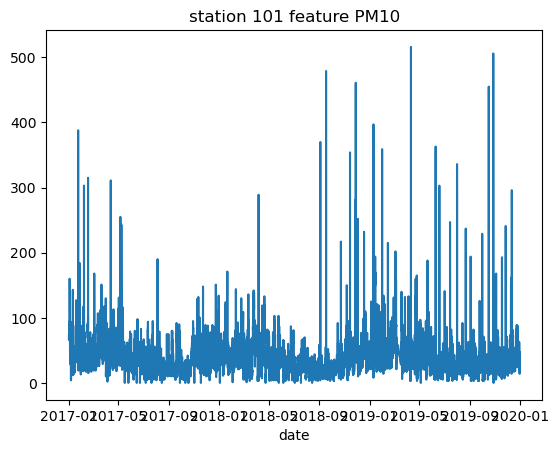

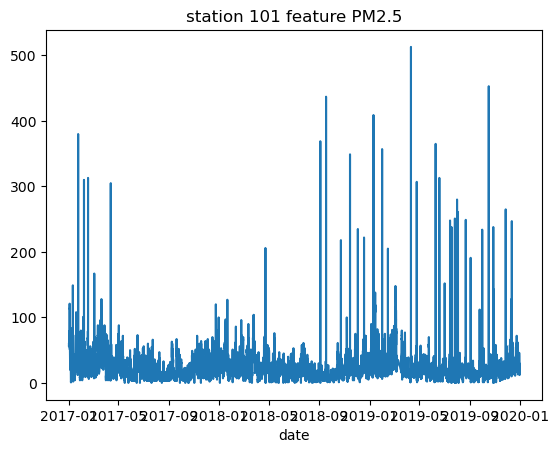

In [9]:
plt.figure(figsize=(8,8))

for i in range(101, 102):
    new_data = new_df[new_df['Station code'] == i]
    #new_date_time = pd.to_datetime(new_data['Measurement date'], format= '%Y/%m/%d') #по дням 
    new_date_time = pd.to_datetime(new_data['Measurement date'], format= '%Y/%m/%d %H:%M') # по часам
    
    for j in features:
        plt.plot(new_date_time, new_data[j])
        plt.title(f'station {i} feature {j}')
        plt.xlabel('date')
        plt.show()

Ну круто, что. Конечно, может быть, лучше бы было для каждой станции найти самое часто значение, но кто это делать будет.......

## Проверка на выбросы

Рассмотрим частотное распределение, да?

<AxesSubplot:xlabel='PM2.5', ylabel='Count'>

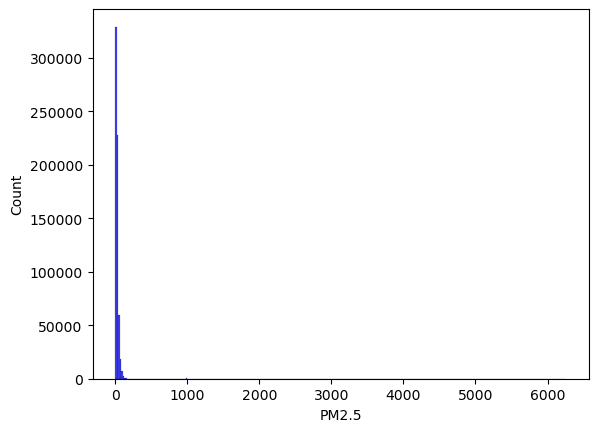

In [10]:
sns.histplot(df['PM2.5'], kde=False, 
            bins=300, color = 'blue')

Такой 'скейлинг то 6к' говорит о том, что в районе 6к есть какие то пакости.
Давайте посмотрим все наибольшие значения.

In [10]:
for i in features:
    print(i, max(df[i]))

SO2 3.736
NO2 38.445
O3 33.6
CO 71.7
PM10 3586.0
PM2.5 6256.0


Действительно, в районе 6к гадости сидят.
Рассмотрим распределение с ограничением до 1.5к, например.

<AxesSubplot:xlabel='PM2.5', ylabel='Count'>

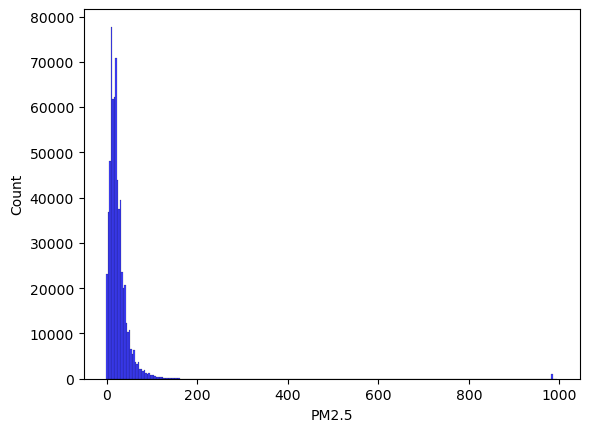

In [11]:
sns.histplot(df[df['PM2.5'] < 1500]['PM2.5'], kde=False, 
            bins=300, color = 'blue')

Ну вот, вроде норм. Только около 1к еще что-то есть. Пока что заменим это все на всякий случай.

Тут можете сами повключать посмотреть для каждого признака.

In [ ]:
p = sns.FacetGrid(data=df, col='Station code', col_wrap=1, height=10)
p.map(sns.histplot, 'PM2.5', bins = 10, stat = 'count')

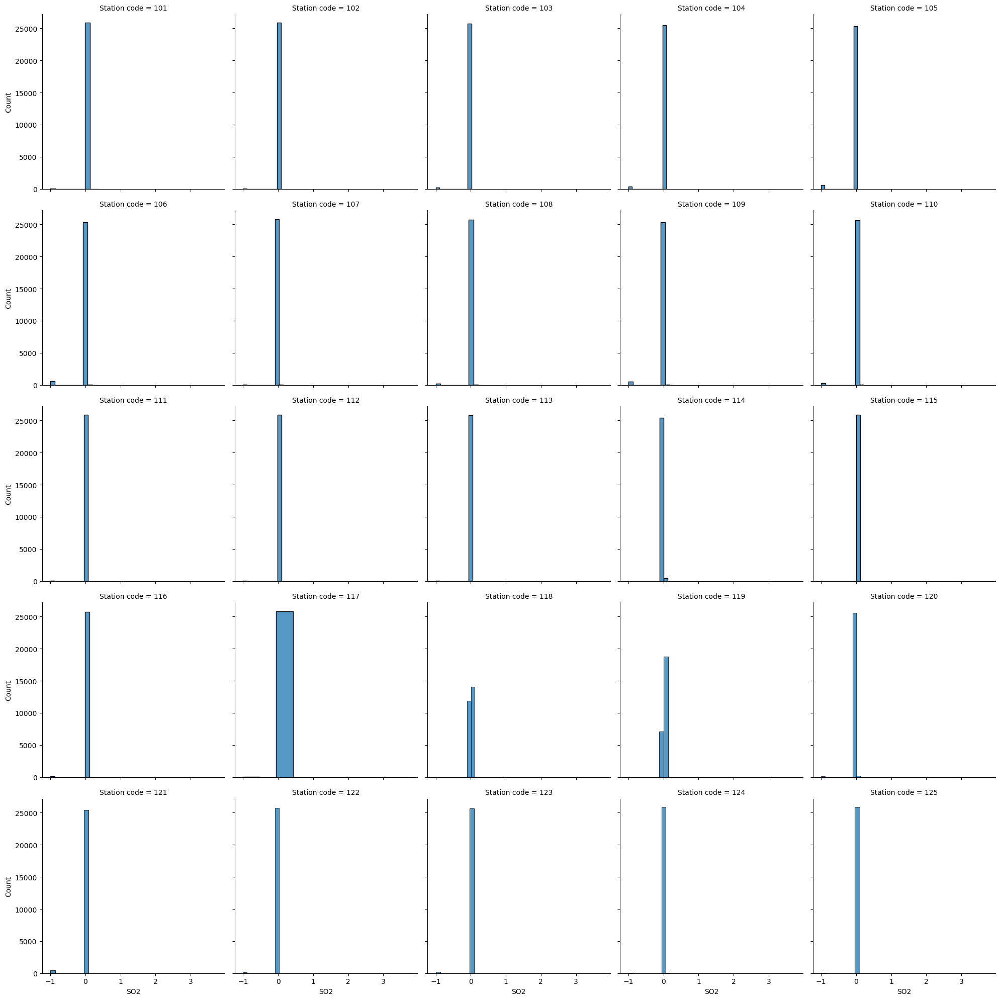

In [8]:
p = sns.FacetGrid(data=df, col='Station code', col_wrap=5, height=4)
p.map(sns.histplot, 'SO2', bins = 10, stat = 'count')

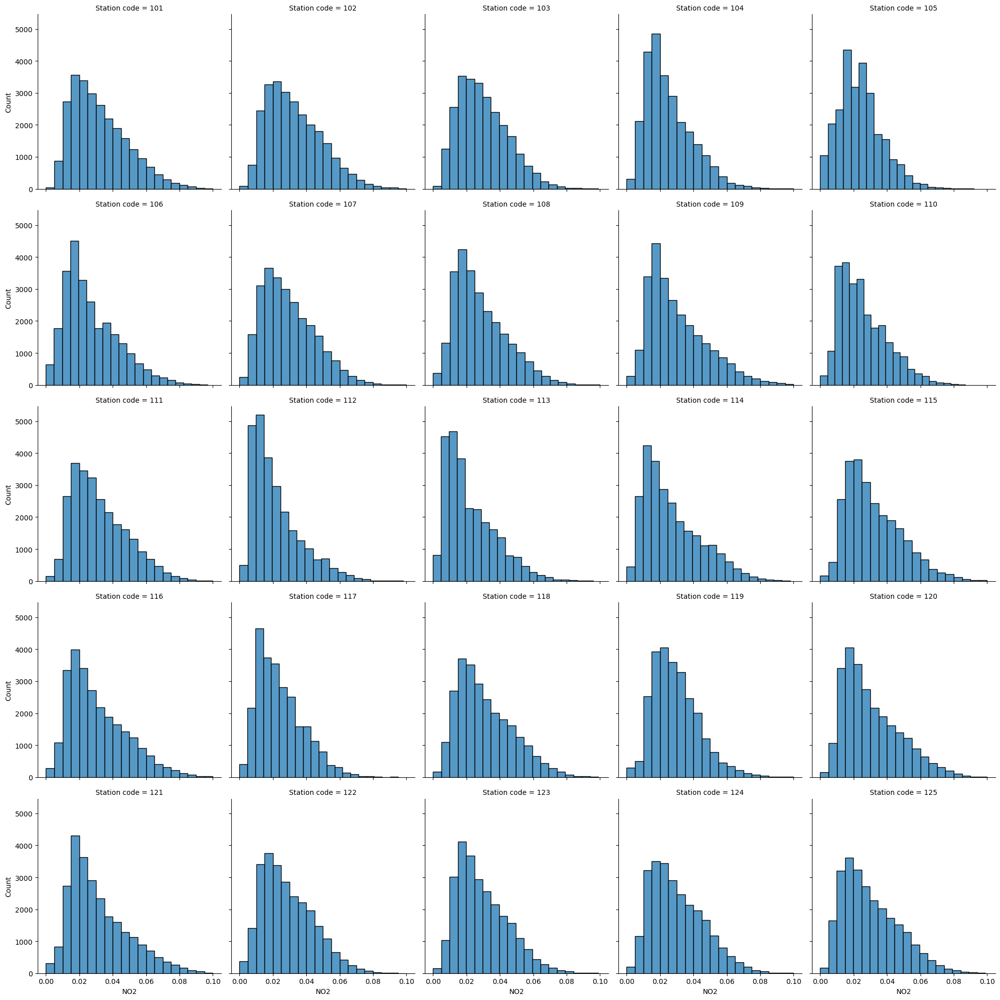

In [16]:
p = sns.FacetGrid(data=new_df, col='Station code', col_wrap=5, height=4)
p.map(sns.histplot, 'NO2', bins = 20, stat = 'count')

In [ ]:
p = sns.FacetGrid(data=df, col='Station code', col_wrap=1, height=10)
p.map(sns.histplot, 'O3', stat = 'count')

In [ ]:
p = sns.FacetGrid(data=df, col='Station code', col_wrap=1, height=10)
p.map(sns.histplot, 'CO', bins = 5, stat = 'count')

In [ ]:
p = sns.FacetGrid(data=df, col='Station code', col_wrap=1, height=10)
p.map(sns.histplot, 'PM10', bins = 1, stat = 'count')

Заменим все плохие значения.

In [13]:
new_df.loc[new_df['SO2'] > 0.015, 'SO2'] = mf_so2
new_df.loc[new_df['NO2'] > 0.1, 'NO2'] = mf_no2
new_df.loc[new_df['O3'] > 0.12, 'O3'] = mf_o3
new_df.loc[new_df['CO'] > 2, 'CO'] = mf_co
new_df.loc[new_df['PM10'] > 200, 'PM10'] = mf_pm10
new_df.loc[new_df['PM2.5'] > 200, 'PM2.5'] = mf_pm25

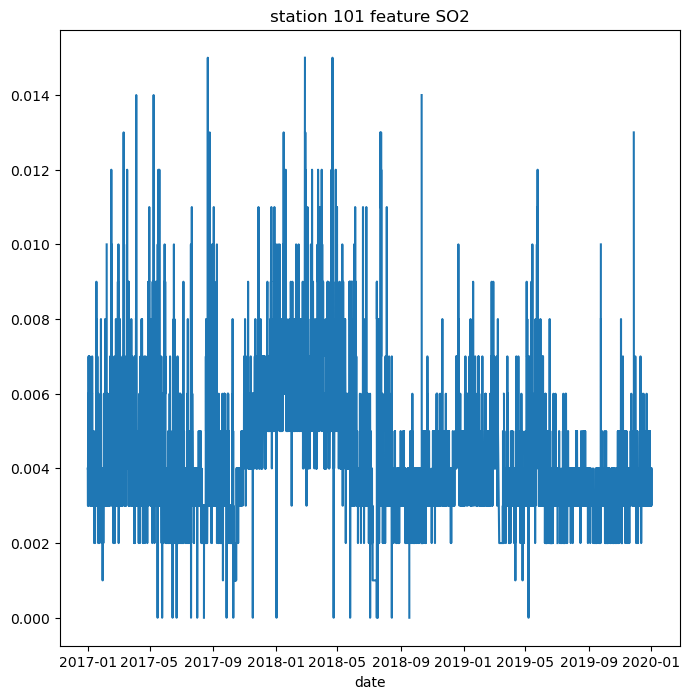

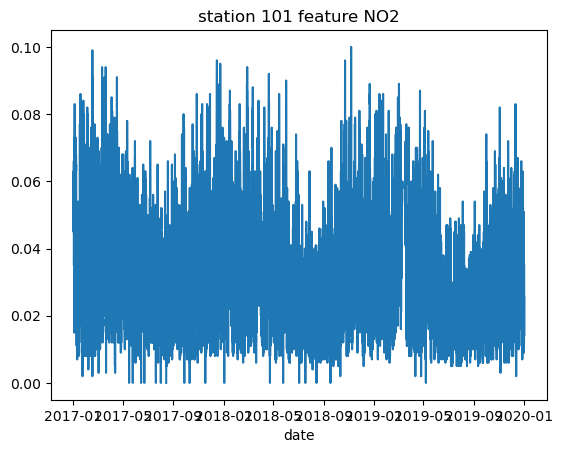

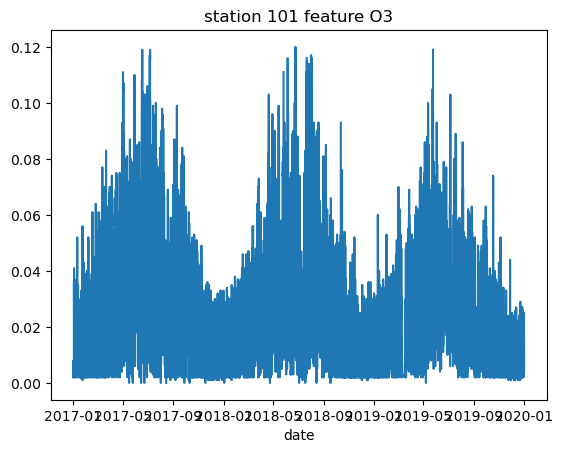

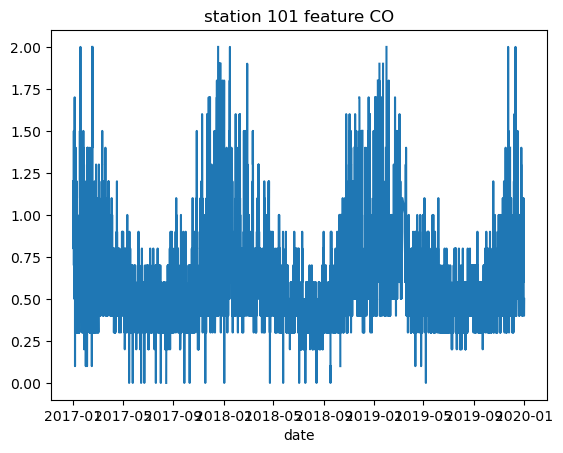

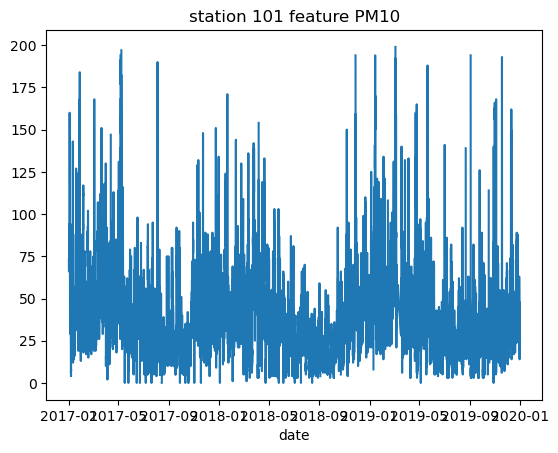

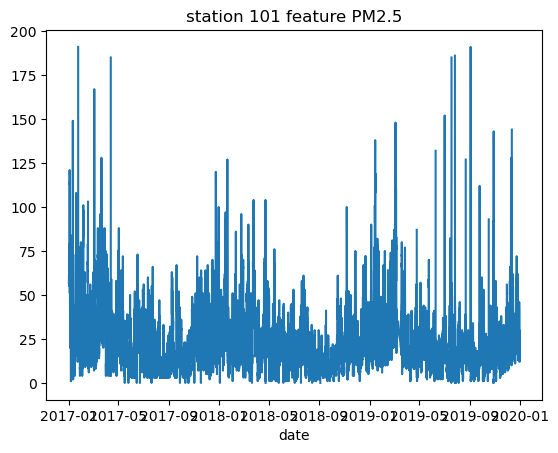

In [13]:
plt.figure(figsize=(8,8))

for i in range(101, 102):
    new_data = new_df[new_df['Station code'] == i]
    #new_date_time = pd.to_datetime(new_data['Measurement date'], format= '%Y/%m/%d') #по дням 
    new_date_time = pd.to_datetime(new_data['Measurement date'], format= '%Y/%m/%d %H:%M') # по часам
    
    for j in features:
        plt.plot(new_date_time, new_data[j])
        plt.title(f'station {i} feature {j}')
        plt.xlabel('date')
        plt.show()

Выборки

Старые коды. Можно не смотреть

In [ ]:
for i in range(101, 126):
    new_data = df[df['Station code'] == i]
    print(f'Станция {i}')
    display(new_data[new_data['PM2.5'] > 200]) # Здесь изменяется значение ['PM2.5'] на любое из features и изменяется порог (> 200)

<b>Так называемая частотная красота</b>

In [46]:
pd.set_option('display.max_columns', None)

threshold = [0.02, 0.1, 0.15, 3, 150, 150]
feature_keys = {}
for i in zip(features, threshold):
    feature_keys[i[0]] = i[1]

for year in range(2017, 2020):
    for feature in feature_keys:
        all_values = []
        for station_code in range(101, 126):
            new_data = df[df['Station code'] == station_code]

            dannie = {}
            dannie['Station code'] = station_code
            for i in range(0,24):
                dannie[i] = 0


            for month in range(1,13):
                for day in range(1, 31): 
                    for hour in range(0,24):
                        month = int(month)
                        day = int(day)
                        hour = int(hour)
                        if hour < 10:
                            hour = f'0{hour}'
                        if month < 10:
                            month = f'0{month}'
                        if day < 10:
                            day = f'0{day}'
                        
                        if month == '02' and int(day) > 28: continue

                        date = f'{year}-{month}-{day} {hour}:00'

                        data_by_date = new_data[new_data['Measurement date'] == date]
                        
                        if len(data_by_date) == 0: print(data_by_date); print(date, station_code, feature); continue

                        if (data_by_date[feature] > feature_keys[feature]).bool(): dannie[int(hour)] += 1
            #station_values.extend(list(dannie.values()))
            all_values.append(list(dannie.values()))
        columns = ['Station code']
        columns.extend(list(range(0,24)))
        dtfrm = pd.DataFrame(all_values, columns=columns)    
        print('################################################################')
        print()            
        print(f'Year {year}, Feature {feature}')
        display(dtfrm)
        print()              
    



################################################################

Year 2017, Feature SO2


,Station code,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23
0,101,0,0,0,0,0,0,0,0,0,0,0,0,2,2,3,2,2,1,0,0,0,0,0,0
1,102,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,1,4,4,0,1,0,0,0,0
2,103,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,104,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,105,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0
5,106,0,0,0,0,0,0,0,1,1,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0
6,107,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
7,108,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,1,2,0,0,0,0,0,0,0
8,109,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
9,110,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0



################################################################

Year 2017, Feature NO2


,Station code,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23
0,101,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
1,102,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,103,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,104,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,105,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5,106,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
6,107,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
7,108,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
8,109,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,1,0
9,110,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0



################################################################

Year 2017, Feature O3


,Station code,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23
0,101,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,102,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,103,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,104,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,105,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5,106,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
6,107,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
7,108,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
8,109,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
9,110,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0



################################################################

Year 2017, Feature CO


,Station code,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23
0,101,0,0,0,0,0,0,0,0,0,0,0,0,2,1,3,1,2,1,0,0,0,0,0,0
1,102,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,1,3,3,0,0,0,0,0,0
2,103,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,104,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,105,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
5,106,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
6,107,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
7,108,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
8,109,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
9,110,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0



################################################################

Year 2017, Feature PM10


,Station code,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23
0,101,2,3,1,1,1,1,2,3,2,3,3,3,4,3,2,3,3,1,1,3,2,2,1,2
1,102,1,1,1,1,1,1,2,2,2,3,3,2,3,2,4,2,3,4,2,2,1,1,0,1
2,103,1,1,1,0,0,0,1,2,2,3,3,2,1,1,2,1,1,1,1,1,1,0,0,1
3,104,4,5,3,2,2,2,3,4,6,5,6,6,6,5,4,5,4,5,4,2,2,2,2,3
4,105,4,4,4,3,2,3,4,4,5,3,4,6,4,3,5,4,5,5,3,2,3,3,3,4
5,106,3,2,2,1,1,1,2,2,3,3,3,3,2,2,3,3,2,2,3,1,2,2,3,4
6,107,5,4,3,2,3,1,3,5,6,7,7,7,7,6,7,8,12,13,9,3,4,5,2,5
7,108,3,4,3,2,2,1,2,2,2,2,2,3,3,4,3,2,4,4,2,1,3,2,2,1
8,109,5,5,5,4,2,3,5,4,4,3,3,3,4,5,4,6,4,4,5,4,5,5,4,5
9,110,4,5,5,3,2,2,5,5,5,5,5,5,4,5,8,5,4,5,4,4,4,5,5,5



################################################################

Year 2017, Feature PM2.5


,Station code,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23
0,101,0,0,0,0,0,0,0,0,0,0,0,0,2,1,0,1,2,1,0,0,0,0,0,0
1,102,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,1,3,0,0,0,0,0,0
2,103,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,104,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
4,105,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0
5,106,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
6,107,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0
7,108,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,2,1,0,0,0,0,0,0
8,109,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
9,110,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,1,1,0,0



################################################################

Year 2018, Feature SO2


,Station code,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23
0,101,0,0,0,0,0,0,0,0,0,0,0,1,2,3,1,2,3,1,0,0,0,0,0,0
1,102,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,103,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,104,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0
4,105,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5,106,0,0,0,0,0,0,0,0,0,0,0,0,1,1,2,1,0,0,0,0,0,0,0,0
6,107,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
7,108,0,0,0,0,0,0,0,0,0,0,0,6,7,3,3,0,0,0,0,0,0,0,0,0
8,109,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
9,110,0,0,0,0,0,0,0,0,0,1,1,1,0,0,1,0,0,0,0,0,0,0,0,0



################################################################

Year 2018, Feature NO2


,Station code,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23
0,101,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,102,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,103,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
3,104,0,0,0,0,0,1,2,1,1,1,1,1,1,0,0,0,0,0,1,1,0,0,0,0
4,105,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5,106,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
6,107,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
7,108,1,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,1
8,109,1,1,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,2,3,4,3
9,110,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0



################################################################

Year 2018, Feature O3


,Station code,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23
0,101,0,0,0,0,0,0,0,0,0,0,0,0,1,0,2,2,0,0,0,0,0,0,0,0
1,102,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3,3,1,0,0,0,0,0,0,0
2,103,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
3,104,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0
4,105,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
5,106,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,1,0,0,0,0,0,0,0,0
6,107,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
7,108,0,0,0,0,0,0,0,0,0,0,0,0,0,1,2,0,0,0,0,0,0,0,0,0
8,109,0,0,0,0,0,0,0,0,0,0,0,0,0,1,4,4,2,1,0,0,0,0,0,0
9,110,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0



################################################################

Year 2018, Feature CO


,Station code,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23
0,101,0,0,0,0,0,0,0,0,0,0,0,1,2,3,1,1,2,0,0,0,0,0,0,0
1,102,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,103,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,104,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
4,105,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5,106,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
6,107,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0
7,108,0,0,0,0,0,0,0,0,0,0,0,4,6,3,3,0,0,0,0,0,0,0,0,0
8,109,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
9,110,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0



################################################################

Year 2018, Feature PM10


,Station code,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23
0,101,1,1,0,0,0,0,0,0,0,0,0,0,1,3,2,1,3,3,3,3,2,1,1,1
1,102,1,1,1,1,1,0,0,0,0,0,0,0,0,1,1,2,2,1,4,2,3,1,1,1
2,103,1,1,0,0,0,0,0,0,0,0,0,1,2,1,1,1,1,3,3,3,4,1,1,1
3,104,2,2,2,2,2,1,1,1,2,1,3,3,4,4,4,7,3,4,3,7,4,3,2,2
4,105,1,2,2,1,1,1,1,1,1,0,4,2,5,3,6,2,3,4,4,5,3,3,2,1
5,106,2,1,1,1,2,1,1,1,2,1,1,1,3,5,6,4,3,5,7,12,5,3,16,4
6,107,1,1,1,1,1,1,2,1,1,2,2,1,2,6,2,4,2,3,5,4,8,6,2,1
7,108,1,1,1,1,1,1,1,1,1,2,1,4,2,1,4,7,5,3,8,11,12,10,9,10
8,109,1,2,2,0,0,0,1,0,0,0,0,2,2,1,2,1,2,2,3,4,2,3,2,2
9,110,1,1,1,1,2,1,1,0,0,0,0,0,1,1,2,1,1,2,2,3,3,2,1,1



################################################################

Year 2018, Feature PM2.5


,Station code,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23
0,101,0,0,0,0,0,0,1,0,0,0,0,0,1,2,0,0,2,2,0,0,0,0,0,0
1,102,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,103,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,2,0,0,0
3,104,0,0,0,0,0,0,1,1,1,1,1,2,3,0,0,1,2,0,1,0,0,0,0,0
4,105,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0
5,106,1,1,1,1,1,1,1,1,0,0,2,0,1,2,0,0,1,1,3,9,1,27,4,2
6,107,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0
7,108,0,0,0,0,0,0,0,0,0,1,0,5,1,1,1,0,11,8,0,2,1,15,12,6
8,109,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
9,110,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0



Empty DataFrame
Columns: [Measurement date, Station code, Address, Latitude, Longitude, SO2, NO2, O3, CO, PM10, PM2.5]
Index: []
2019-01-01 00:00 101 SO2
Empty DataFrame
Columns: [Measurement date, Station code, Address, Latitude, Longitude, SO2, NO2, O3, CO, PM10, PM2.5]
Index: []
2019-03-08 21:00 101 SO2
Empty DataFrame
Columns: [Measurement date, Station code, Address, Latitude, Longitude, SO2, NO2, O3, CO, PM10, PM2.5]
Index: []
2019-03-08 22:00 101 SO2
Empty DataFrame
Columns: [Measurement date, Station code, Address, Latitude, Longitude, SO2, NO2, O3, CO, PM10, PM2.5]
Index: []
2019-03-08 23:00 101 SO2
Empty DataFrame
Columns: [Measurement date, Station code, Address, Latitude, Longitude, SO2, NO2, O3, CO, PM10, PM2.5]
Index: []
2019-03-09 00:00 101 SO2
Empty DataFrame
Columns: [Measurement date, Station code, Address, Latitude, Longitude, SO2, NO2, O3, CO, PM10, PM2.5]
Index: []
2019-03-09 01:00 101 SO2
Empty DataFrame
Columns: [Measurement date, Station code, Address, Latitude

,Station code,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23
0,101,0,0,0,0,0,0,0,0,0,0,1,3,1,8,3,2,3,0,0,0,0,0,0,0
1,102,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,103,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,104,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,105,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
5,106,0,0,0,0,0,0,0,0,0,0,2,3,5,5,5,7,0,0,1,0,0,0,0,0
6,107,0,0,0,0,0,0,0,0,0,0,2,0,1,7,6,4,4,3,0,0,0,0,0,0
7,108,0,0,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0
8,109,0,0,0,0,0,0,0,0,0,0,0,0,1,3,6,6,1,1,0,0,0,0,0,0
9,110,0,0,0,0,0,0,0,0,0,0,0,1,3,3,4,3,2,1,0,0,0,0,0,0



Empty DataFrame
Columns: [Measurement date, Station code, Address, Latitude, Longitude, SO2, NO2, O3, CO, PM10, PM2.5]
Index: []
2019-01-01 00:00 101 NO2
Empty DataFrame
Columns: [Measurement date, Station code, Address, Latitude, Longitude, SO2, NO2, O3, CO, PM10, PM2.5]
Index: []
2019-03-08 21:00 101 NO2
Empty DataFrame
Columns: [Measurement date, Station code, Address, Latitude, Longitude, SO2, NO2, O3, CO, PM10, PM2.5]
Index: []
2019-03-08 22:00 101 NO2
Empty DataFrame
Columns: [Measurement date, Station code, Address, Latitude, Longitude, SO2, NO2, O3, CO, PM10, PM2.5]
Index: []
2019-03-08 23:00 101 NO2
Empty DataFrame
Columns: [Measurement date, Station code, Address, Latitude, Longitude, SO2, NO2, O3, CO, PM10, PM2.5]
Index: []
2019-03-09 00:00 101 NO2
Empty DataFrame
Columns: [Measurement date, Station code, Address, Latitude, Longitude, SO2, NO2, O3, CO, PM10, PM2.5]
Index: []
2019-03-09 01:00 101 NO2
Empty DataFrame
Columns: [Measurement date, Station code, Address, Latitude

,Station code,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23
0,101,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,102,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,103,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
3,104,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,105,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5,106,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
6,107,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
7,108,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
8,109,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
9,110,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0



Empty DataFrame
Columns: [Measurement date, Station code, Address, Latitude, Longitude, SO2, NO2, O3, CO, PM10, PM2.5]
Index: []
2019-01-01 00:00 101 O3
Empty DataFrame
Columns: [Measurement date, Station code, Address, Latitude, Longitude, SO2, NO2, O3, CO, PM10, PM2.5]
Index: []
2019-03-08 21:00 101 O3
Empty DataFrame
Columns: [Measurement date, Station code, Address, Latitude, Longitude, SO2, NO2, O3, CO, PM10, PM2.5]
Index: []
2019-03-08 22:00 101 O3
Empty DataFrame
Columns: [Measurement date, Station code, Address, Latitude, Longitude, SO2, NO2, O3, CO, PM10, PM2.5]
Index: []
2019-03-08 23:00 101 O3
Empty DataFrame
Columns: [Measurement date, Station code, Address, Latitude, Longitude, SO2, NO2, O3, CO, PM10, PM2.5]
Index: []
2019-03-09 00:00 101 O3
Empty DataFrame
Columns: [Measurement date, Station code, Address, Latitude, Longitude, SO2, NO2, O3, CO, PM10, PM2.5]
Index: []
2019-03-09 01:00 101 O3
Empty DataFrame
Columns: [Measurement date, Station code, Address, Latitude, Long

,Station code,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23
0,101,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,102,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0
2,103,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0
3,104,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0
4,105,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0
5,106,0,0,0,0,0,0,0,0,0,0,1,2,2,2,0,1,0,0,0,0,0,0,0,0
6,107,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,1,0,0,0,0,0,0
7,108,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
8,109,0,0,0,0,0,0,0,0,0,0,0,0,0,1,2,1,1,1,0,0,0,0,0,0
9,110,0,0,0,0,0,0,0,0,0,0,0,0,0,1,2,1,1,1,0,0,0,0,0,0



Empty DataFrame
Columns: [Measurement date, Station code, Address, Latitude, Longitude, SO2, NO2, O3, CO, PM10, PM2.5]
Index: []
2019-01-01 00:00 101 CO
Empty DataFrame
Columns: [Measurement date, Station code, Address, Latitude, Longitude, SO2, NO2, O3, CO, PM10, PM2.5]
Index: []
2019-03-08 21:00 101 CO
Empty DataFrame
Columns: [Measurement date, Station code, Address, Latitude, Longitude, SO2, NO2, O3, CO, PM10, PM2.5]
Index: []
2019-03-08 22:00 101 CO
Empty DataFrame
Columns: [Measurement date, Station code, Address, Latitude, Longitude, SO2, NO2, O3, CO, PM10, PM2.5]
Index: []
2019-03-08 23:00 101 CO
Empty DataFrame
Columns: [Measurement date, Station code, Address, Latitude, Longitude, SO2, NO2, O3, CO, PM10, PM2.5]
Index: []
2019-03-09 00:00 101 CO
Empty DataFrame
Columns: [Measurement date, Station code, Address, Latitude, Longitude, SO2, NO2, O3, CO, PM10, PM2.5]
Index: []
2019-03-09 01:00 101 CO
Empty DataFrame
Columns: [Measurement date, Station code, Address, Latitude, Long

,Station code,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23
0,101,0,0,0,0,0,0,0,0,0,0,1,2,1,5,2,1,1,0,0,0,0,0,0,0
1,102,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,103,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,104,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,105,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5,106,0,0,0,0,0,0,0,0,0,0,2,3,5,4,2,3,0,0,1,0,0,0,0,0
6,107,0,0,0,0,0,0,0,0,0,0,2,0,1,7,6,4,4,3,0,1,0,0,0,0
7,108,0,0,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0
8,109,0,0,0,0,0,0,0,0,0,0,0,0,1,3,6,4,1,0,0,0,0,0,0,0
9,110,0,0,0,0,0,0,0,0,0,0,0,1,3,2,4,3,2,1,0,0,0,0,0,0



Empty DataFrame
Columns: [Measurement date, Station code, Address, Latitude, Longitude, SO2, NO2, O3, CO, PM10, PM2.5]
Index: []
2019-01-01 00:00 101 PM10
Empty DataFrame
Columns: [Measurement date, Station code, Address, Latitude, Longitude, SO2, NO2, O3, CO, PM10, PM2.5]
Index: []
2019-03-08 21:00 101 PM10
Empty DataFrame
Columns: [Measurement date, Station code, Address, Latitude, Longitude, SO2, NO2, O3, CO, PM10, PM2.5]
Index: []
2019-03-08 22:00 101 PM10
Empty DataFrame
Columns: [Measurement date, Station code, Address, Latitude, Longitude, SO2, NO2, O3, CO, PM10, PM2.5]
Index: []
2019-03-08 23:00 101 PM10
Empty DataFrame
Columns: [Measurement date, Station code, Address, Latitude, Longitude, SO2, NO2, O3, CO, PM10, PM2.5]
Index: []
2019-03-09 00:00 101 PM10
Empty DataFrame
Columns: [Measurement date, Station code, Address, Latitude, Longitude, SO2, NO2, O3, CO, PM10, PM2.5]
Index: []
2019-03-09 01:00 101 PM10
Empty DataFrame
Columns: [Measurement date, Station code, Address, La

,Station code,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23
0,101,4,2,4,4,4,4,4,3,4,5,4,4,3,6,9,4,6,5,3,2,2,2,4,1
1,102,4,2,4,4,4,4,4,4,4,5,4,3,3,3,3,3,3,2,2,2,2,2,3,3
2,103,3,3,3,3,3,3,3,3,3,4,3,3,3,3,3,4,3,2,4,2,4,3,3,4
3,104,3,7,4,3,3,3,4,4,5,5,6,7,9,6,8,6,6,5,5,5,5,3,3,3
4,105,6,7,5,5,4,4,4,5,6,5,4,6,8,7,8,6,4,3,5,5,3,3,5,5
5,106,11,13,13,10,12,12,9,8,11,10,9,10,14,11,10,11,8,8,13,11,11,10,18,9
6,107,9,10,8,9,8,8,9,8,8,7,8,8,6,9,8,8,7,7,13,9,11,47,15,10
7,108,7,7,7,7,5,5,6,3,5,3,5,7,7,6,9,10,5,13,7,10,9,7,22,12
8,109,7,4,5,4,4,4,4,5,4,5,4,3,4,3,6,6,4,3,3,3,4,4,4,4
9,110,5,4,5,4,5,4,4,3,2,4,5,3,4,3,5,4,4,4,2,3,3,2,2,2



Empty DataFrame
Columns: [Measurement date, Station code, Address, Latitude, Longitude, SO2, NO2, O3, CO, PM10, PM2.5]
Index: []
2019-01-01 00:00 101 PM2.5
Empty DataFrame
Columns: [Measurement date, Station code, Address, Latitude, Longitude, SO2, NO2, O3, CO, PM10, PM2.5]
Index: []
2019-03-08 21:00 101 PM2.5
Empty DataFrame
Columns: [Measurement date, Station code, Address, Latitude, Longitude, SO2, NO2, O3, CO, PM10, PM2.5]
Index: []
2019-03-08 22:00 101 PM2.5
Empty DataFrame
Columns: [Measurement date, Station code, Address, Latitude, Longitude, SO2, NO2, O3, CO, PM10, PM2.5]
Index: []
2019-03-08 23:00 101 PM2.5
Empty DataFrame
Columns: [Measurement date, Station code, Address, Latitude, Longitude, SO2, NO2, O3, CO, PM10, PM2.5]
Index: []
2019-03-09 00:00 101 PM2.5
Empty DataFrame
Columns: [Measurement date, Station code, Address, Latitude, Longitude, SO2, NO2, O3, CO, PM10, PM2.5]
Index: []
2019-03-09 01:00 101 PM2.5
Empty DataFrame
Columns: [Measurement date, Station code, Addre

,Station code,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23
0,101,0,0,0,1,1,0,0,0,1,1,0,0,1,2,6,2,3,3,0,1,0,0,0,0
1,102,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,103,1,1,1,0,0,0,0,0,0,0,1,1,2,1,0,0,1,1,1,1,1,1,1,1
3,104,0,0,0,0,0,0,0,0,0,1,1,1,1,1,2,0,0,1,0,0,0,0,0,0
4,105,1,1,1,2,2,1,2,2,0,1,1,2,2,2,4,2,0,1,1,0,0,0,1,1
5,106,2,2,2,1,1,1,0,1,1,1,1,2,4,2,4,3,2,1,3,12,1,21,5,3
6,107,2,3,2,2,2,2,0,1,1,1,3,2,2,6,2,2,3,3,1,1,5,4,1,3
7,108,1,1,1,1,1,0,0,0,0,0,0,3,0,2,5,7,11,13,0,1,2,26,12,8
8,109,2,0,1,0,0,0,0,0,0,0,0,1,1,1,1,2,1,2,1,1,0,0,1,1
9,110,2,2,1,0,0,0,0,1,1,0,1,0,1,1,2,1,1,0,0,1,1,0,0,0


Делаем датасет


In [8]:
so2_min = df['SO2'].min()
so2_max = df['SO2'].max()

no2_min = df['NO2'].min()
no2_max = df['NO2'].max()

o3_min = df['O3'].min()
o3_max = df['O3'].max()

co_min = df['CO'].min()
co_max = df['CO'].max()

pm10_min = df['PM10'].min()
pm10_max = df['PM10'].max()

pm25_min = df['PM2.5'].min()
pm25_max = df['PM2.5'].max()

In [16]:
mf_values[0] = (mf_values[0] - so2_min) / (so2_max - so2_min)
mf_values[1] = (mf_values[1] - no2_min) / (no2_max - no2_min)
mf_values[2] = (mf_values[2] - o3_min) / (o3_max - o3_min)
mf_values[3] = (mf_values[3] - co_min) / (co_max - co_min)
mf_values[4] = (mf_values[4] - pm10_min) / (pm10_max - pm10_min)
mf_values[5] = (mf_values[5] - pm25_min) / (pm25_max - pm25_min)

In [9]:
normalized_df = new_df.copy()

normalized_df['SO2'] = (normalized_df['SO2'] - so2_min) / (so2_max - so2_min)
normalized_df['NO2'] = (normalized_df['NO2'] - no2_min) / (no2_max - no2_min)
normalized_df['O3'] = (normalized_df['O3'] - o3_min) / (o3_max - o3_min)
normalized_df['CO'] = (normalized_df['CO'] - co_min) / (co_max - co_min)
normalized_df['PM10'] = (normalized_df['PM10'] - pm10_min) / (pm10_max - pm10_min)
normalized_df['PM2.5'] = (normalized_df['PM2.5'] - pm25_min) / (pm25_max - pm25_min)
normalized_df

,Measurement date,Station code,SO2,NO2,O3,CO,PM10,PM2.5
0,2017-01-01 00:00,101,0.211993,0.026848,0.028960,0.030261,0.020630,0.009270
1,2017-01-01 01:00,101,0.211993,0.026822,0.028960,0.030261,0.020072,0.009589
2,2017-01-01 02:00,101,0.211993,0.026771,0.028960,0.030261,0.019794,0.009589
3,2017-01-01 03:00,101,0.211993,0.026771,0.028960,0.030261,0.019794,0.009429
4,2017-01-01 04:00,101,0.211782,0.026645,0.028960,0.030261,0.019515,0.009909
...,...,...,...,...,...,...,...,...
647506,2019-12-31 19:00,125,0.211782,0.026062,0.029277,0.020633,0.006691,0.002877
647507,2019-12-31 20:00,125,0.211782,0.025986,0.029335,0.019257,0.007248,0.003196
647508,2019-12-31 21:00,125,0.211782,0.025935,0.029335,0.019257,0.006970,0.002877
647509,2019-12-31 22:00,125,0.211782,0.026366,0.029017,0.020633,0.007248,0.003037


In [14]:
date = pd.unique(normalized_df['Measurement date'])
full_data = []
date_data = []

station_codes = list(range(101,126))

for indi, i in enumerate(date):
    codeks = list(map(int, i.split(' ')[0].split('-')))
    codeks.append(int(i.split(' ')[1].split(':')[0]))
    date_data.extend(codeks)

    if len(normalized_df[normalized_df['Measurement date'] == i].values) < 25:
        codes_in_pd = [i[1] for i in normalized_df[normalized_df['Measurement date'] == i].values]


        for code in station_codes:
            if code in codes_in_pd:
                for j in normalized_df[normalized_df['Measurement date'] == i].values:
                    if code in j:
                        date_data.extend(j[1:].tolist())
                        break
            else:
                date_data.append(code)
                date_data.extend(mf_values)
    else: 
        for j in normalized_df[normalized_df['Measurement date'] == i].values:
            date_data.extend(j[1:].tolist())
    
    full_data.append(date_data.copy())
    date_data.clear()
    print(f'Выполнено {indi + 1} из {len(date)}')

with open("dateset_korea4", "wb") as fp:   #Pickling
    pickle.dump(full_data, fp)

Выполнено 1 из 25906
Выполнено 2 из 25906
Выполнено 3 из 25906
Выполнено 4 из 25906
Выполнено 5 из 25906
Выполнено 6 из 25906
Выполнено 7 из 25906
Выполнено 8 из 25906
Выполнено 9 из 25906
Выполнено 10 из 25906
Выполнено 11 из 25906
Выполнено 12 из 25906
Выполнено 13 из 25906
Выполнено 14 из 25906
Выполнено 15 из 25906
Выполнено 16 из 25906
Выполнено 17 из 25906
Выполнено 18 из 25906
Выполнено 19 из 25906
Выполнено 20 из 25906
Выполнено 21 из 25906
Выполнено 22 из 25906
Выполнено 23 из 25906
Выполнено 24 из 25906
Выполнено 25 из 25906
Выполнено 26 из 25906
Выполнено 27 из 25906
Выполнено 28 из 25906
Выполнено 29 из 25906
Выполнено 30 из 25906
Выполнено 31 из 25906
Выполнено 32 из 25906
Выполнено 33 из 25906
Выполнено 34 из 25906
Выполнено 35 из 25906
Выполнено 36 из 25906
Выполнено 37 из 25906
Выполнено 38 из 25906
Выполнено 39 из 25906
Выполнено 40 из 25906
Выполнено 41 из 25906
Выполнено 42 из 25906
Выполнено 43 из 25906
Выполнено 44 из 25906
Выполнено 45 из 25906
Выполнено 46 из 259

In [15]:
print(full_data[-1])

[2019, 3, 11, 9, 101, 0.004, 0.017, 0.002, 0.4, 27.0, 17.0, 102, 0.004, 0.017, 0.002, 0.4, 27.0, 17.0, 103, 0.004, 0.017, 0.002, 0.4, 27.0, 17.0, 104, 0.21241554054054052, 0.02697426796805679, 0.029104046242774562, 0.026134800550206325, 0.03206021745190967, 0.010068723030206169, 105, 0.21220439189189183, 0.02667004690074788, 0.02907514450867052, 0.030261348005502064, 0.0275996654586005, 0.011027649033082947, 106, 0.2119932432432432, 0.02646723285587527, 0.02907514450867052, 0.024759284731774415, 0.02843601895734597, 0.010068723030206169, 107, 0.004, 0.017, 0.002, 0.4, 27.0, 17.0, 108, 0.21241554054054052, 0.02667004690074788, 0.02904624277456647, 0.030261348005502064, 0.024254251463618624, 0.009109797027329392, 109, 0.004, 0.017, 0.002, 0.4, 27.0, 17.0, 110, 0.2128378378378378, 0.02651793636709342, 0.02904624277456647, 0.024759284731774415, 0.017005854474491218, 0.00639284001917852, 111, 0.2119932432432432, 0.02697426796805679, 0.029017341040462427, 0.033012379642365884, 0.021745190967

In [17]:
date = pd.unique(normalized_df['Measurement date'])
full_data = []
date_data = []
station_codes = list(range(101,126))

for indi, i in enumerate(date):
    codeks = list(map(int, i.split(' ')[0].split('-')))
    codeks.append(int(i.split(' ')[1].split(':')[0]))
    codeks.extend([0, 0, 0])
    date_data.append(codeks)

    if len(normalized_df[normalized_df['Measurement date'] == i].values) < 25:
        codes_in_pd = [i[1] for i in normalized_df[normalized_df['Measurement date'] == i].values]


        for code in station_codes:
            if code in codes_in_pd:
                for j in normalized_df[normalized_df['Measurement date'] == i].values:
                    if code in j:
                        date_data.append(j[1:].tolist())
                        break
            else:
                buff = [code]
                buff.extend(mf_values)
                date_data.append(buff.copy())
                
    else: 
        for j in normalized_df[normalized_df['Measurement date'] == i].values:
            date_data.append(j[1:])
    
    full_data.append(date_data.copy())
    date_data.clear()
    print(f'Выполнено {indi + 1} из {len(date)}')
with open("dateset_korea1", "wb") as fp:   #Pickling
   pickle.dump(full_data, fp)



Выполнено 1 из 25906
Выполнено 2 из 25906
Выполнено 3 из 25906
Выполнено 4 из 25906
Выполнено 5 из 25906
Выполнено 6 из 25906
Выполнено 7 из 25906
Выполнено 8 из 25906
Выполнено 9 из 25906
Выполнено 10 из 25906
Выполнено 11 из 25906
Выполнено 12 из 25906
Выполнено 13 из 25906
Выполнено 14 из 25906
Выполнено 15 из 25906
Выполнено 16 из 25906
Выполнено 17 из 25906
Выполнено 18 из 25906
Выполнено 19 из 25906
Выполнено 20 из 25906
Выполнено 21 из 25906
Выполнено 22 из 25906
Выполнено 23 из 25906
Выполнено 24 из 25906
Выполнено 25 из 25906
Выполнено 26 из 25906
Выполнено 27 из 25906
Выполнено 28 из 25906
Выполнено 29 из 25906
Выполнено 30 из 25906
Выполнено 31 из 25906
Выполнено 32 из 25906
Выполнено 33 из 25906
Выполнено 34 из 25906
Выполнено 35 из 25906
Выполнено 36 из 25906
Выполнено 37 из 25906
Выполнено 38 из 25906
Выполнено 39 из 25906
Выполнено 40 из 25906
Выполнено 41 из 25906
Выполнено 42 из 25906
Выполнено 43 из 25906
Выполнено 44 из 25906
Выполнено 45 из 25906
Выполнено 46 из 259

In [18]:
print(full_data[-1])
ber = []
for i in full_data:
    if len(i) not in ber: ber.append(len(i))
print(ber)
for i in full_data[-1]:
    print(i)

[[2019, 3, 11, 9, 0, 0, 0], [101, 0.2119932432432432, 0.025782735454430217, 0.028959537572254335, 0.019257221458046765, 0.007805965988291051, 0.002876778008630334], [102, 0.2119932432432432, 0.025782735454430217, 0.028959537572254335, 0.019257221458046765, 0.007805965988291051, 0.002876778008630334], [103, 0.2119932432432432, 0.025782735454430217, 0.028959537572254335, 0.019257221458046765, 0.007805965988291051, 0.002876778008630334], [104, 0.21241554054054052, 0.02697426796805679, 0.029104046242774562, 0.026134800550206325, 0.03206021745190967, 0.010068723030206169], [105, 0.21220439189189183, 0.02667004690074788, 0.02907514450867052, 0.030261348005502064, 0.0275996654586005, 0.011027649033082947], [106, 0.2119932432432432, 0.02646723285587527, 0.02907514450867052, 0.024759284731774415, 0.02843601895734597, 0.010068723030206169], [107, 0.2119932432432432, 0.025782735454430217, 0.028959537572254335, 0.019257221458046765, 0.007805965988291051, 0.002876778008630334], [108, 0.212415540540

![](https://cs11.pikabu.ru/post_img/2020/04/22/11/og_og_1587582090253134525.jpg)